In [1]:
from sklearn.metrics import precision_recall_curve, auc
from scipy.spatial.distance import squareform
from scipy.stats import wasserstein_distance
from itertools import combinations, product
from scipy.interpolate import interp1d
from collections import defaultdict

import os
import time
import graco
import random
import numpy as np
import pandas as pd
import ringity as rng
import seaborn as sns
import networkx as nx
import matplotlib.pyplot as plt

In [2]:
NETWORK_DIR = "/Users/markusyoussef/Desktop/git/supplements/data/networks/"

## Functions

In [3]:
def get_BA_parameter(N, rho):
    return max(int((N - np.sqrt(N *(N - 2*N*rho + 2*rho)))/2),1)

def get_RGG_parameter(rho, d):   
    if   d == 1:
        return 1-np.sqrt(1-rho)
    elif d < 4 :
        rs = np.linspace(rho,rho+0.25,21)
    elif d < 6:
        rs = np.linspace(rho,rho+0.5,21)
    else:
        raise Exception
    rhos = sorted(nx.density(nx.random_geometric_graph(2**10, r, d)) for r in rs)
    if rhos[0] == 0:
        rhos = rhos[1:]
        rs = rs[1:]
    f = interp1d(rhos, rs, 'cubic')
    return float(f(rho))

def get_WS_parameter(rho):
    return max(int((2**6-1)*rho),4)

# Genereate networks

In [4]:
N_list   = [1000, 2000, 3000]
rho_list = [0.05, 0.075, 0.1]
n_samples = 2

### Erdos-Renyi

In [5]:
ER_DIR = NETWORK_DIR + '/er'

if not os.path.exists(ER_DIR):
    os.makedirs(ER_DIR)

for N in N_list:
    for rho in rho_list:
        for nr in range(n_samples):
            G = nx.erdos_renyi_graph(N,rho)
            nx.write_edgelist(G, f"{ER_DIR}/{N}_{rho:.3f}_{nr}.txt")

### Barabasi-Albert

In [6]:
BA_DIR = NETWORK_DIR + '/ba'

if not os.path.exists(BA_DIR):
    os.makedirs(BA_DIR)
    
for N in N_list:
    for rho in rho_list:
        m = get_BA_parameter(N,rho)
        for nr in range(n_samples):
            G = nx.barabasi_albert_graph(N,m)
            nx.write_edgelist(G, f"{BA_DIR}/{N}_{m}_{nr}.txt")

### 3D Random geometric graphs

In [7]:
RGG3_DIR = NETWORK_DIR + '/rgg3'

if not os.path.exists(RGG3_DIR):
    os.makedirs(RGG3_DIR)

for N in N_list:
    for rho in rho_list:
        r = get_RGG_parameter(rho,3)
        for nr in range(n_samples):
            G = nx.random_geometric_graph(N,r,3)
            nx.write_edgelist(G, f"{RGG3_DIR}/{N}_{r:.3f}_{nr}.txt")

### PPIs

In [10]:
PPI_DIR = NETWORK_DIR + '/ppi'

if not os.path.exists(PPI_DIR):
    os.makedirs(PPI_DIR)

for file in os.listdir(NETWORK_DIR + '/ppi_full'):
    if not file.endswith('.txt'):
        continue
    G = nx.read_edgelist(f"{NETWORK_DIR}/ppi_full/{file}")
    
    if 1000 <= G.number_of_nodes() <= 5000:
        nx.write_edgelist(G, f"{PPI_DIR}/{file}")

### Autonomous networks

In [12]:
AS_DIR = NETWORK_DIR + '/as'

if not os.path.exists(AS_DIR):
    os.makedirs(AS_DIR)

for file in os.listdir(NETWORK_DIR + '/as_full'):
    if not file.endswith('.txt'):
        continue
    G = nx.read_edgelist(f"{NETWORK_DIR}/as_full/{file}")
    
    if 1000 <= G.number_of_nodes() <= 3000:
        nx.write_edgelist(G, f"{AS_DIR}/{file}")

# Calculate characteristic properties

In [13]:
models = ['er', 'ba', 'rgg3', 'ppi', 'as']

file_list = []

clus_dict = defaultdict(dict)
comm_dict = defaultdict(dict)
Delt_dict = defaultdict(dict)

for mod in models:
    model_dir = f"{NETWORK_DIR}/{mod}"
    for file in os.listdir(model_dir):
        print(mod, file, end='\r')
        if not file.endswith('.txt'):
            continue
        else:
            file = file[:-4]
            
        G = nx.read_edgelist(f"{model_dir}/{file}.txt")
        clus, comm = graco.triangle_signature(G)
        
        file_list.append((mod,file))
        
        clus_dict[mod][file] = clus
        comm_dict[mod][file] = comm
        Delt_dict[mod][file] = np.array((clus, comm)).T

# Here we go

In [14]:
n_dists = 5

index = pd.MultiIndex.from_tuples(file_list).sort_values()
df_list = [pd.DataFrame(columns = index, 
                        index   = index, 
                        dtype   = float) for _ in range(n_dists)]

In [15]:
iter_len = sum(1 for _ in combinations(index, 2))  # just needed ro calculate 'loading bar'

t1 = time.time()
for count, (idx_s, idx_t) in enumerate(combinations(index, 2), 1):

    mod_s, file_s = idx_s
    mod_t, file_t = idx_t
    
    x_s = clus_dict[mod_s][file_s]
    y_s = comm_dict[mod_s][file_s]
    
    x_t = clus_dict[mod_t][file_t]
    y_t = comm_dict[mod_t][file_t]
    
    Delta_s = np.nan_to_num(np.vstack([x_s,y_s]))
    Delta_t = np.nan_to_num(np.vstack([x_t,y_t]))
    
    x_s = x_s[~np.isnan(x_s)]
    y_s = y_s[~np.isnan(y_s)]
    x_t = x_t[~np.isnan(x_t)]
    y_t = y_t[~np.isnan(y_t)]

    assert not np.isnan(x_s).any()
    assert not np.isnan(x_t).any()
    assert not np.isnan(y_s).any()
    assert not np.isnan(y_t).any() 
    
    m_s = np.mean(x_s)
    n_s = np.mean(y_s)
    
    m_t = np.mean(x_t)
    n_t = np.mean(y_t)
    
    delta_1 = np.array([m_s,n_s])
    delta_2 = np.array([m_t,n_t])
    
    p = np.array(delta_1)
    q = np.array(delta_2)
    
    if (p == 0).all():
        p = np.ones_like(p)/2
    if (q == 0).all():
        q = np.ones_like(q)/2
    
    df_list[0].loc[idx_s, idx_t] = abs(m_s-m_t)
    df_list[1].loc[idx_s, idx_t] = abs(n_s-n_t)
    df_list[2].loc[idx_s, idx_t] = graco.distance(delta_1, delta_2, 'euclidean') / np.sqrt(2)
    df_list[3].loc[idx_s, idx_t] = graco.distance(delta_1, delta_2, 'cityblock') / 2
    df_list[4].loc[idx_s, idx_t] = graco.distance(delta_1, delta_2, 'canberra')  / 2
    t2 = time.time()
    
    print(f"{100*count/iter_len:.2f}% - {t2-t1:.2f} sec", end='\r')

print()
print('------------------')    
for df in df_list:
    print(df.max().max())

100.00% - 9.96 sec
------------------
0.5656973969983654
0.5215022956715616
0.543603603261851
0.5431691061102696
0.9474687856116087


# ROC-AUC

In [16]:
y_scores_list = [1-squareform(df, checks=False) for df in df_list]

y_true_list = []


for df in df_list:
    y_true = pd.DataFrame(np.zeros([len(df),len(df)], dtype=int), 
                                   columns=index, 
                                   index=index)

    for mod in models:
        y_true.loc[mod,mod] = 1
    
    y_true = squareform(y_true, checks=False)
    y_true_list.append(y_true)

In [17]:
precisions = []
recalls = []
thresholds = []
aucs = []

for y_true, y_scores in zip(y_true_list, y_scores_list):
    prec, reca, thre = precision_recall_curve(y_true, y_scores)
    precisions.append(prec)
    recalls.append(   reca)
    thresholds.append(thre)
    
    aucs.append(auc(reca, prec))

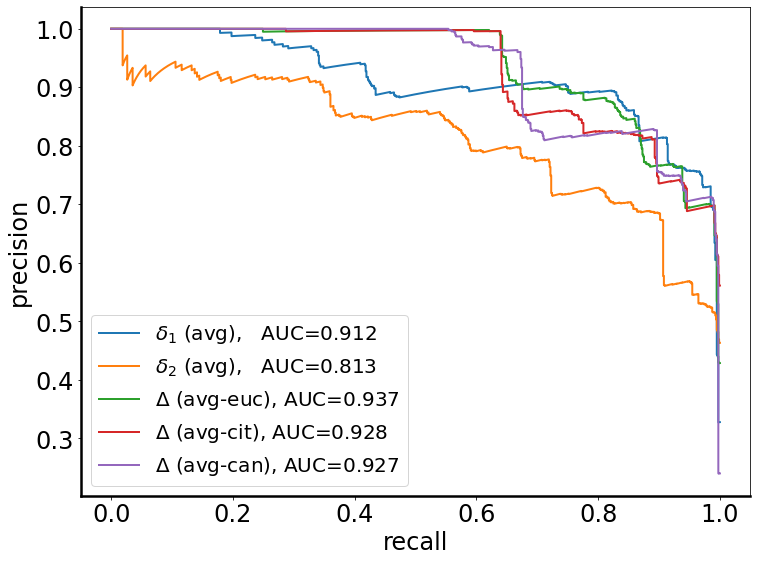

In [18]:
fig, ax = plt.subplots(figsize=(12,9))

ax.plot(recalls[0], precisions[0], linewidth=2, label=r'$\delta_1$ (avg),   ' f'AUC={aucs[0]:.3f}');
ax.plot(recalls[1], precisions[1], linewidth=2, label=r'$\delta_2$ (avg),   ' f'AUC={aucs[1]:.3f}');
ax.plot(recalls[2], precisions[2], linewidth=2, label=r'$\Delta$ (avg-euc), ' f'AUC={aucs[2]:.3f}');
ax.plot(recalls[3], precisions[3], linewidth=2, label=r'$\Delta$ (avg-cit), ' f'AUC={aucs[3]:.3f}');
ax.plot(recalls[4], precisions[4], linewidth=2, label=r'$\Delta$ (avg-can), ' f'AUC={aucs[4]:.3f}');

ax.set_xlabel('recall'   , fontsize=24)
ax.set_ylabel('precision', fontsize=24)

ax.legend(fontsize=20)
rng.ax_setup(ax)
#fig.savefig("/Users/markusyoussef/Desktop/all_pictures/synthetic_AUCs.pdf")
#fig.savefig("/Users/markusyoussef/Desktop/all_pictures/synthetic_AUCs.png")

# Load real networks

In [3]:
n_sizes = 2
n_denss = 2
n_samples = 2

In [4]:
directory = "/Users/markusyoussef/Desktop/git/supplements/data/networks/as/"
files = sorted(filter(lambda x:x.endswith('.txt'),os.listdir(directory)))

as_G_dict = {}
while len(as_G_dict) < n_sizes*n_denss*n_samples:
    file, = random.sample(files, 1)
    files.remove(file)
    
    G = nx.read_edgelist(f"{directory}/{file}")
    if 2000 < len(G) < 3000:
        name = file.split('.')[0]
        as_G_dict[('AS',name)] = G

In [5]:
directory = "/Users/markusyoussef/Desktop/git/supplements/data/networks/PPI/"
files = sorted(filter(lambda x:x.endswith('.txt'),os.listdir(directory)))

PPI_G_dict = {}
for file in files:
    G = nx.read_edgelist(f"{directory}/{file}")
    if 2000 < len(G) < 4000:
        name = file.split('.')[0]
        PPI_G_dict[('PPI',name)] = G

## Create synthetic networks

In [6]:
min_size = min(map(nx.number_of_nodes, as_G_dict.values()))
max_size = max(map(nx.number_of_nodes, as_G_dict.values()))

min_dens = min(map(nx.density, as_G_dict.values()))
max_dens = max(map(nx.density, as_G_dict.values()))

In [7]:
synt_models = ('ER', 'BA', 'RGG2', 'RGG3', 'WS')
real_models = ('AS', 'PPI')
all_models = synt_models + real_models

sizes = np.linspace(min_size, max_size, n_sizes, dtype=int)
denss = np.linspace(min_dens, max_dens, n_denss)
samples = range(n_samples)

G_dict = {}

for mod in all_models:
    if   mod == 'ER':
        for N in sizes:
            for rho in denss:
                for nr in samples:
                    G_dict[(mod, (N,rho,nr))] = nx.erdos_renyi_graph(N, rho)
                    
    elif mod == 'BA':
        for N in sizes:
            for rho in denss:
                m = get_BA_parameter(N,rho)
                for nr in samples:
                    G_dict[(mod, (N,rho,nr))] = nx.barabasi_albert_graph(N,m)
                    
    elif mod == 'RGG1':
        for N in sizes:
            for rho in denss:
                r = get_RGG_parameter(rho,1)
                for nr in samples:
                    G_dict[(mod, (N,rho,nr))] = nx.random_geometric_graph(N,r,1)
                    
    elif mod == 'RGG2':
        for N in sizes:
            for rho in denss:
                r = get_RGG_parameter(rho,2)
                for nr in samples:
                    G_dict[(mod, (N,rho,nr))] = nx.random_geometric_graph(N,r,2)
                    
    elif mod == 'RGG3':
        for N in sizes:
            for rho in denss:
                r = get_RGG_parameter(rho,3)
                for nr in samples:
                    G_dict[(mod, (N,rho,nr))] = nx.random_geometric_graph(N,r,3)
                    
    elif mod == 'RGG4':
        for N in sizes:
            for rho in denss:
                r = get_RGG_parameter(rho,4)
                for nr in samples:
                    G_dict[(mod, (N,rho,nr))] = nx.random_geometric_graph(N,r,4)
                    
    elif mod == 'RGG5':
        for N in sizes:
            for rho in denss:
                r = get_RGG_parameter(rho,5)
                for nr in samples:
                    G_dict[(mod, (N,rho,nr))] = nx.random_geometric_graph(N,r,5)
                    
    elif mod == 'WS':
        for N in sizes:
            for rho in denss:
                k = get_WS_parameter(rho)
                for nr in samples:
                    G_dict[(mod, (N,rho,nr))] = nx.watts_strogatz_graph(N,k,0.1)
    
    elif mod == 'AS':
        G_dict.update(as_G_dict)
        
    elif mod == 'PPI':
        G_dict.update(PPI_G_dict)

## Synthetic network calculations

In [8]:
synt_index = pd.MultiIndex.from_product([synt_models, product(sizes, denss, samples)],
                                        names = ('model', 'stats')
                                       ).sort_values()
synt_df_list = [pd.DataFrame(columns = synt_index, 
                             index   = synt_index, 
                             dtype   = float) for _ in range(5)]

In [9]:
iter_len = sum(1 for _ in combinations(synt_index, 2))

t1 = time.time()
for count, (idx1, idx2) in enumerate(combinations(synt_index, 2), 1):
    
    G1 = G_dict[idx1]
    G2 = G_dict[idx2]
    
    xs, ys = graco.triangle_signature(G1)
    xt, yt = graco.triangle_signature(G2)
    
    Deltas = np.nan_to_num(np.vstack([xs,ys]))
    Deltat = np.nan_to_num(np.vstack([xt,yt]))
    
    xs = xs[~np.isnan(xs)]
    ys = ys[~np.isnan(ys)]
    xt = xt[~np.isnan(xt)]
    yt = yt[~np.isnan(yt)]

    assert not np.isnan(xs).any()
    assert not np.isnan(xt).any()
    assert not np.isnan(ys).any()
    assert not np.isnan(yt).any() 
    
    ms = np.mean(xs)
    ns = np.mean(ys)
    
    mt = np.mean(xt)
    nt = np.mean(yt)
    
    Delta1 = np.array([ms,ns])
    Delta2 = np.array([mt,nt])
    
    p = np.array(Delta1)
    q = np.array(Delta2)
    
    if (p == 0).all():
        p = np.ones_like(p)/2
    if (q == 0).all():
        q = np.ones_like(q)/2
    
    synt_df_list[0].loc[idx1, idx2] = abs(ms-mt)
    synt_df_list[1].loc[idx1, idx2] = abs(ns-nt)
    synt_df_list[2].loc[idx1, idx2] = graco.distance(Delta1,Delta2, 'euclidean') / np.sqrt(2)
    synt_df_list[3].loc[idx1, idx2] = graco.distance(Delta1,Delta2, 'cityblock') / 2
    synt_df_list[4].loc[idx1, idx2] = graco.distance(Delta1,Delta2, 'canberra')  / 2
    t2 = time.time()
    
    print(f"{100*count/iter_len:.2f}% - {t2-t1:.2f} sec", end='\r')

print()
print('------------------')    
for df in synt_df_list:
    print(df.max().max())

100.00% - 81.03 sec
------------------
0.5970553497810231
0.5080860835590153
0.554358439553543
0.5525707166700192
0.9964402919459698


In [10]:
synt_y_scores_list = [1-squareform(df, checks=False) for df in synt_df_list]

synt_y_true_list = []


for df in synt_df_list:
    y_true = pd.DataFrame(np.zeros([len(df),len(df)], dtype=int), 
                                   columns=synt_index, index=synt_index)

    for mod in synt_models:
        y_true.loc[mod,mod] = 1
    
    y_true = squareform(y_true, checks=False)
    synt_y_true_list.append(y_true)

In [11]:
precision_1, recall_1, thresholds_1 = precision_recall_curve(synt_y_true_list[0], synt_y_scores_list[0])
precision_2, recall_2, thresholds_2 = precision_recall_curve(synt_y_true_list[1], synt_y_scores_list[1])
precision_3, recall_3, thresholds_3 = precision_recall_curve(synt_y_true_list[2], synt_y_scores_list[2])
precision_4, recall_4, thresholds_4 = precision_recall_curve(synt_y_true_list[3], synt_y_scores_list[3])
precision_5, recall_5, thresholds_5 = precision_recall_curve(synt_y_true_list[4], synt_y_scores_list[4])

In [12]:
auc1 = auc(recall_1, precision_1)
auc2 = auc(recall_2, precision_2)
auc3 = auc(recall_3, precision_3)
auc4 = auc(recall_4, precision_4)
auc5 = auc(recall_5, precision_5)
#auc6 = auc(recall_6, precision_6)

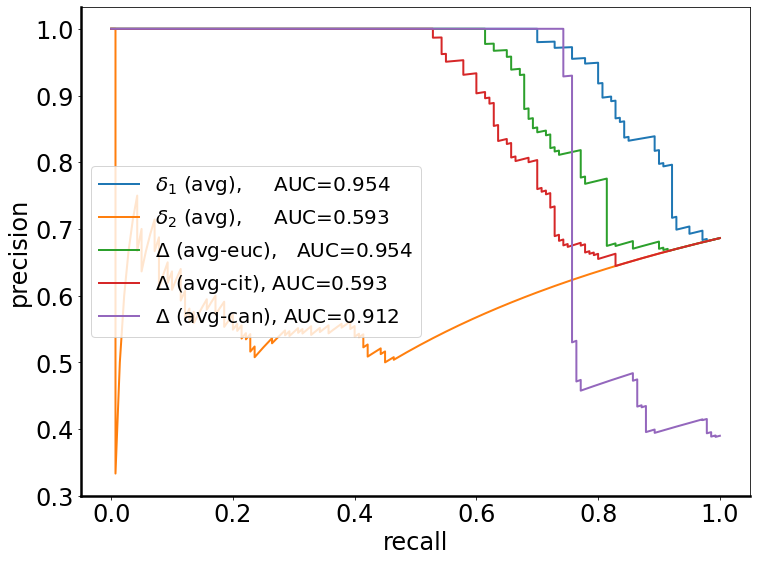

In [15]:
fig, ax = plt.subplots(figsize=(12,9))

ax.plot(recall_1, precision_1, linewidth=2, label=r'$\delta_1$ (avg),     ' f'AUC={auc1:.3f}');
ax.plot(recall_2, precision_2, linewidth=2, label=r'$\delta_2$ (avg),     ' f'AUC={auc2:.3f}');
ax.plot(recall_3, precision_3, linewidth=2, label=r'$\Delta$ (avg-euc),   ' f'AUC={auc1:.3f}');
ax.plot(recall_4, precision_4, linewidth=2, label=r'$\Delta$ (avg-cit), ' f'AUC={auc2:.3f}');
ax.plot(recall_5, precision_5, linewidth=2, label=r'$\Delta$ (avg-can), ' f'AUC={auc3:.3f}');
#ax.plot(recall_6, precision_6, linewidth=2, label=r'$\Delta$ (emd),     ' f'AUC={auc3:.2f}');

ax.set_xlabel('recall'   , fontsize=24)
ax.set_ylabel('precision', fontsize=24)

ax.legend(fontsize=20)
rng.ax_setup(ax)
fig.savefig("/Users/markusyoussef/Desktop/all_pictures/synthetic_AUCs.pdf")
fig.savefig("/Users/markusyoussef/Desktop/all_pictures/synthetic_AUCs.png")

## Real network calculations

In [16]:
real_index = pd.MultiIndex.from_tuples(list(as_G_dict.keys())+list(PPI_G_dict.keys()), 
                                       names = ('model', 'name')
                                      ).sort_values()
real_df_list = [pd.DataFrame(columns = real_index, 
                             index   = real_index, 
                             dtype   = float) for _ in range(5)]

In [17]:
iter_len = sum(1 for _ in combinations(real_index, 2))

t1 = time.time()
for count, (idx1, idx2) in enumerate(combinations(real_index, 2), 1):
    
    G1 = G_dict[idx1]
    G2 = G_dict[idx2]
    
    xs, ys = graco.triangle_signature(G1)
    xt, yt = graco.triangle_signature(G2)
    
    Deltas = np.nan_to_num(np.vstack([xs,ys]))
    Deltat = np.nan_to_num(np.vstack([xt,yt]))
    
    xs = xs[~np.isnan(xs)]
    ys = ys[~np.isnan(ys)]
    xt = xt[~np.isnan(xt)]
    yt = yt[~np.isnan(yt)]

    assert not np.isnan(xs).any()
    assert not np.isnan(xt).any()
    assert not np.isnan(ys).any()
    assert not np.isnan(yt).any() 
    
    ms = np.mean(xs)
    ns = np.mean(ys)
    
    mt = np.mean(xt)
    nt = np.mean(yt)
    
    Delta1 = np.array([ms,ns])
    Delta2 = np.array([mt,nt])
    
    p = np.array(Delta1)
    q = np.array(Delta2)
    
    if (p == 0).all():
        p = np.ones_like(p)/2
    if (q == 0).all():
        q = np.ones_like(q)/2
    
    real_df_list[0].loc[idx1, idx2] = abs(ms-mt)
    real_df_list[1].loc[idx1, idx2] = abs(ns-nt)
    real_df_list[2].loc[idx1, idx2] = graco.distance(Delta1,Delta2, 'euclidean') / np.sqrt(2)
    real_df_list[3].loc[idx1, idx2] = graco.distance(Delta1,Delta2, 'cityblock') / 2
    real_df_list[4].loc[idx1, idx2] = graco.distance(Delta1,Delta2, 'canberra')  / 2
    #synt_df_list[4].loc[idx1, idx2] = graco.emd(Deltas.reshape(-1,2),Deltat.reshape(-1,2))
    t2 = time.time()
    
    print(f"{100*count/iter_len:.2f}% - {t2-t1:.2f} sec", end='\r')

print()
print('------------------')    
for df in real_df_list:
    print(df.max().max())

100.00% - 10.36 sec
------------------
0.20905998861585245
0.04314122917372131
0.15093199260722262
0.12606400197436546
0.5467501753444306


In [18]:
real_y_scores_list = [1-squareform(df, checks=False) for df in real_df_list]

real_y_true_list = []


for df in real_df_list:
    y_true = pd.DataFrame(np.zeros([len(df),len(df)], dtype=int), 
                                   columns=real_index, index=real_index)

    for mod in real_models:
        y_true.loc[mod,mod] = 1
    
    y_true = squareform(y_true, checks=False)
    real_y_true_list.append(y_true)

In [19]:
precision_1, recall_1, thresholds_1 = precision_recall_curve(real_y_true_list[0], real_y_scores_list[0])
precision_2, recall_2, thresholds_2 = precision_recall_curve(real_y_true_list[1], real_y_scores_list[1])
precision_3, recall_3, thresholds_3 = precision_recall_curve(real_y_true_list[2], real_y_scores_list[2])
precision_4, recall_4, thresholds_4 = precision_recall_curve(real_y_true_list[3], real_y_scores_list[3])
precision_5, recall_5, thresholds_5 = precision_recall_curve(real_y_true_list[4], real_y_scores_list[4])

In [20]:
auc1 = auc(recall_1, precision_1)
auc2 = auc(recall_2, precision_2)
auc3 = auc(recall_3, precision_3)
auc4 = auc(recall_4, precision_4)
auc5 = auc(recall_5, precision_5)

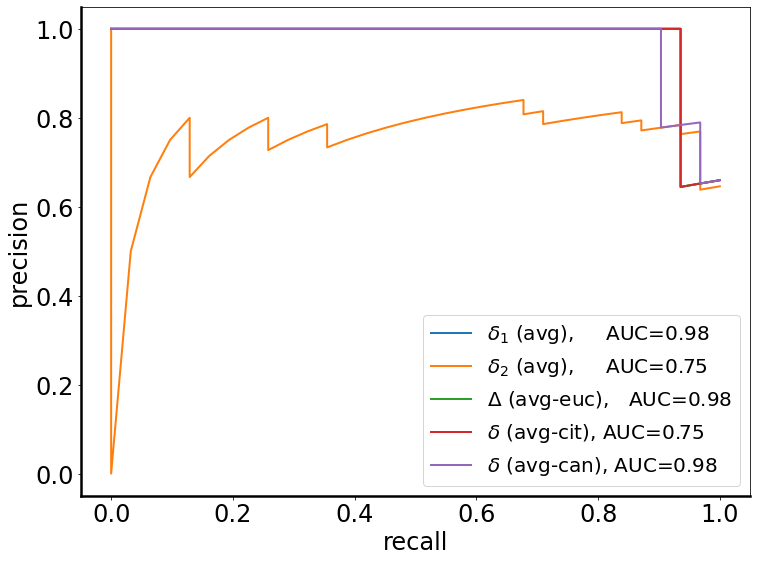

In [21]:
fig, ax = plt.subplots(figsize=(12,9))

ax.plot(recall_1, precision_1, linewidth=2, label=r'$\delta_1$ (avg),     ' f'AUC={auc1:.2f}');
ax.plot(recall_2, precision_2, linewidth=2, label=r'$\delta_2$ (avg),     ' f'AUC={auc2:.2f}');
ax.plot(recall_3, precision_3, linewidth=2, label=r'$\Delta$ (avg-euc),   ' f'AUC={auc1:.2f}');
ax.plot(recall_4, precision_4, linewidth=2, label=r'$\Delta$ (avg-cit), ' f'AUC={auc2:.2f}');
ax.plot(recall_5, precision_5, linewidth=2, label=r'$\Delta$ (avg-can), ' f'AUC={auc3:.2f}');
#ax.plot(recall_6, precision_6, linewidth=2, label=r'$\Delta$ (emd),     ' f'AUC={auc3:.2f}');

ax.set_xlabel('recall'   , fontsize=24)
ax.set_ylabel('precision', fontsize=24)

ax.legend(fontsize=20)
rng.ax_setup(ax)
fig.savefig("/Users/markusyoussef/Desktop/all_pictures/real_AUCs.pdf")
fig.savefig("/Users/markusyoussef/Desktop/all_pictures/real_AUCs.png")

## Combined network calculations

In [22]:
mix_df_list = [pd.DataFrame(index   = synt_index, 
                            columns = real_index, 
                            dtype   = float) for _ in range(5)]

In [23]:
iter_len = sum(1 for _ in product(synt_index, real_index))

t1 = time.time()
for count, (idx1, idx2) in enumerate(product(synt_index, real_index), 1):
    
    G1 = G_dict[idx1]
    G2 = G_dict[idx2]
    
    xs, ys = graco.triangle_signature(G1)
    xt, yt = graco.triangle_signature(G2)
    
    Deltas = np.nan_to_num(np.vstack([xs,ys]))
    Deltat = np.nan_to_num(np.vstack([xt,yt]))
    
    xs = xs[~np.isnan(xs)]
    ys = ys[~np.isnan(ys)]
    xt = xt[~np.isnan(xt)]
    yt = yt[~np.isnan(yt)]

    assert not np.isnan(xs).any()
    assert not np.isnan(xt).any()
    assert not np.isnan(ys).any()
    assert not np.isnan(yt).any() 
    
    ms = np.mean(xs)
    ns = np.mean(ys)
    
    mt = np.mean(xt)
    nt = np.mean(yt)
    
    Delta1 = np.array([ms,ns])
    Delta2 = np.array([mt,nt])
    
    p = np.array(Delta1)
    q = np.array(Delta2)
    
    if (p == 0).all():
        p = np.ones_like(p)/2
    if (q == 0).all():
        q = np.ones_like(q)/2
    
    mix_df_list[0].loc[idx1, idx2] = abs(ms-mt)
    mix_df_list[1].loc[idx1, idx2] = abs(ns-nt)
    mix_df_list[2].loc[idx1, idx2] = graco.distance(Delta1,Delta2, 'euclidean') / np.sqrt(2)
    mix_df_list[3].loc[idx1, idx2] = graco.distance(Delta1,Delta2, 'cityblock') / 2
    mix_df_list[4].loc[idx1, idx2] = graco.distance(Delta1,Delta2, 'canberra')  / 2
    #mix_df_list[4].loc[idx1, idx2] = graco.emd(Deltas.reshape(-1,2),Deltat.reshape(-1,2))
    t2 = time.time()
    
    print(f"{100*count/iter_len:.2f}% - {t2-t1:.2f} sec", end='\r')

print()
print('------------------')    
for df in mix_df_list:
    print(df.max().max())

100.00% - 82.42 sec
------------------
0.4554515959222533
0.49847616339521705
0.4553932688076435
0.4553932650718745
0.9761119210907778


In [24]:
all_df_list = []

for synt_df, real_df, mix_df in zip(synt_df_list, real_df_list, mix_df_list):
    top_df = pd.concat([synt_df , mix_df ], axis=1)
    bot_df = pd.concat([mix_df.T, real_df], axis=1)
    all_df = pd.concat([top_df  , bot_df ])
    
    all_df_list.append(all_df)

In [25]:
all_y_scores_list = [1-squareform(df, checks=False) for df in all_df_list]

all_y_true_list = []


all_index = pd.MultiIndex.from_tuples(list(synt_index) + list(real_index))
for df in all_df_list:
    y_true = pd.DataFrame(np.zeros([len(df),len(df)], dtype=int), 
                              index   = all_index,
                              columns = all_index)

    for mod in all_models:
        y_true.loc[mod,mod] = 1
    
    y_true = squareform(y_true, checks=False)
    all_y_true_list.append(y_true)

In [26]:
precision_1, recall_1, thresholds_1 = precision_recall_curve(all_y_true_list[0], all_y_scores_list[0])
precision_2, recall_2, thresholds_2 = precision_recall_curve(all_y_true_list[1], all_y_scores_list[1])
precision_3, recall_3, thresholds_3 = precision_recall_curve(all_y_true_list[2], all_y_scores_list[2])
precision_4, recall_4, thresholds_4 = precision_recall_curve(all_y_true_list[3], all_y_scores_list[3])
precision_5, recall_5, thresholds_5 = precision_recall_curve(all_y_true_list[4], all_y_scores_list[4])

In [27]:
auc1 = auc(recall_1, precision_1)
auc2 = auc(recall_2, precision_2)
auc3 = auc(recall_3, precision_3)
auc4 = auc(recall_4, precision_4)
auc5 = auc(recall_5, precision_5)

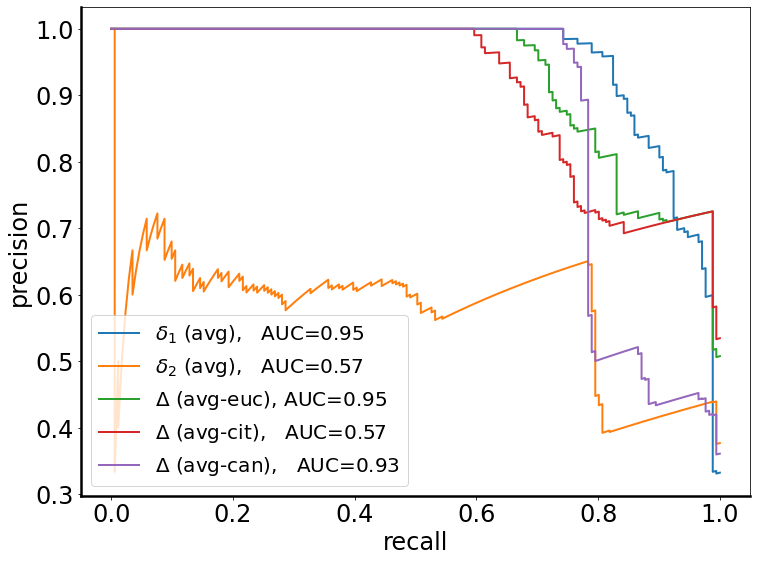

In [28]:
fig, ax = plt.subplots(figsize=(12,9))

ax.plot(recall_1, precision_1, linewidth=2, label=r'$\delta_1$ (avg),   ' f'AUC={auc1:.2f}');
ax.plot(recall_2, precision_2, linewidth=2, label=r'$\delta_2$ (avg),   ' f'AUC={auc2:.2f}');
ax.plot(recall_3, precision_3, linewidth=2, label=r'$\Delta$ (avg-euc), ' f'AUC={auc1:.2f}');
ax.plot(recall_4, precision_4, linewidth=2, label=r'$\Delta$ (avg-cit),   ' f'AUC={auc2:.2f}');
ax.plot(recall_5, precision_5, linewidth=2, label=r'$\Delta$ (avg-can),   ' f'AUC={auc3:.2f}');
#ax.plot(recall_6, precision_6, linewidth=2, label=r'$\Delta$ (emd),     ' f'AUC={auc3:.2f}');

ax.set_xlabel('recall'   , fontsize=24)
ax.set_ylabel('precision', fontsize=24)

ax.legend(fontsize=20)
rng.ax_setup(ax)
fig.savefig("/Users/markusyoussef/Desktop/all_pictures/combined_AUCs.pdf")
fig.savefig("/Users/markusyoussef/Desktop/all_pictures/combined_AUCs.png")

In [60]:
auc(recall_1, precision_1), auc(recall_2, precision_2), auc(recall_3, precision_3), auc(recall_4, precision_4)

(0.7818509554066477,
 0.6039614413109184,
 0.7424693272798224,
 0.8222689202026018)

In [19]:
synt_df_list[0].head()

model                            BA                                          \
size                           2067                                    2132   
density                    0.002076            0.002146            0.002076   
sample                            0         1         0         1         0   
model size density  sample                                                    
BA    2067 0.002076 0           NaN  0.004986  0.000403  0.002380  0.001843   
                    1           NaN       NaN  0.004583  0.007366  0.006829   
           0.002146 0           NaN       NaN       NaN  0.002783  0.002246   
                    1           NaN       NaN       NaN       NaN  0.000537   
      2132 0.002076 0           NaN       NaN       NaN       NaN       NaN   

model                                                           ER            \
size                                                          2067             
density                               0.002146            0.002076             
sample                             1         0         1         0         1   
model size density  sample                                                     
BA    2067 0.002076 0       0.003726  0.000784  0.001219  0.013352  0.014242   
                    1       0.001259  0.005770  0.003767  0.008366  0.009256   
           0.002146 0       0.003324  0.001187  0.000816  0.012949  0.013839   
                    1       0.006107  0.001596  0.003599  0.015732  0.016622   
      2132 0.002076 0       0.005569  0.001059  0.003061  0.015195  0.016085   

model                       ...      RGG2                RGG3            \
size                        ...      2132                2067             
density                     ...  0.002146            0.002076             
sample                      ...         0         1         0         1   
model size density  sample  ...                                           
BA    2067 0.002076 0       ...  0.578589  0.571812  0.478426  0.465433   
                    1       ...  0.583574  0.576798  0.483412  0.470419   
           0.002146 0       ...  0.578991  0.572215  0.478829  0.465836   
                    1       ...  0.576208  0.569432  0.476046  0.463053   
      2132 0.002076 0       ...  0.576746  0.569970  0.476584  0.463590   

model                                                                         \
size                                                2132                       
density                     0.002146            0.002076            0.002146   
sample                             0         1         0         1         0   
model size density  sample                                                     
BA    2067 0.002076 0       0.478806  0.460636  0.486002  0.495500  0.483128   
                    1       0.483792  0.465621  0.490987  0.500486  0.488114   
           0.002146 0       0.479209  0.461038  0.486404  0.495903  0.483531   
                    1       0.476426  0.458256  0.483622  0.493120  0.480748   
      2132 0.002076 0       0.476963  0.458793  0.484159  0.493657  0.481285   

model                                 
size                                  
density                               
sample                             1  
model size density  sample            
BA    2067 0.002076 0       0.481047  
                    1       0.486033  
           0.002146 0       0.481450  
                    1       0.478667  
      2132 0.002076 0       0.479205  

[5 rows x 32 columns]

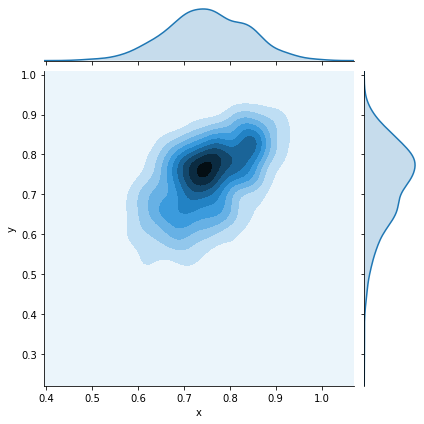

In [55]:
N   = sizes[1]
rho = densities[0]


G = G_dict[('RGG1', N, rho, 0)]

data = pd.DataFrame(graco.triangle_signature(G), index=('x','y')).T
g = sns.jointplot(x='x', y='y', data=data, kind='kde');

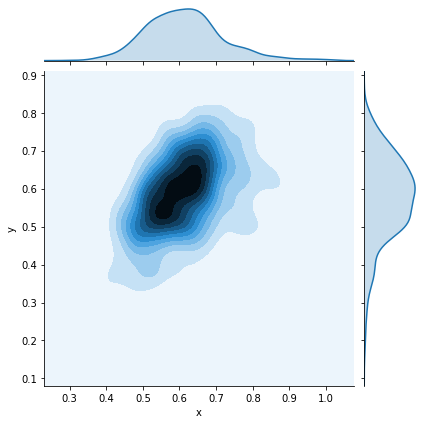

In [56]:
N   = sizes[1]
rho = densities[0]


G = G_dict[('RGG2', N, rho, 0)]

data = pd.DataFrame(graco.triangle_signature(G), index=('x','y')).T
g = sns.jointplot(x='x', y='y', data=data, kind='kde');

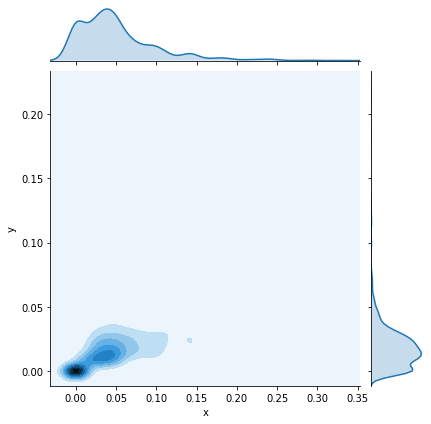

In [62]:
N   = sizes[1]
rho = densities[0]


G = G_dict[('BA', N, rho, 0)]

data = pd.DataFrame(graco.triangle_signature(G), index=('x','y')).T
g = sns.jointplot(x='x', y='y', data=data, kind='kde');

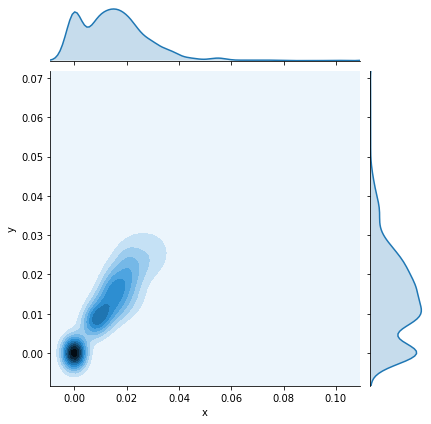

In [61]:
N   = sizes[1]
rho = densities[0]


G = G_dict[('ER', N, rho, 0)]

data = pd.DataFrame(graco.triangle_signature(G), index=('x','y')).T
g = sns.jointplot(x='x', y='y', data=data, kind='kde');

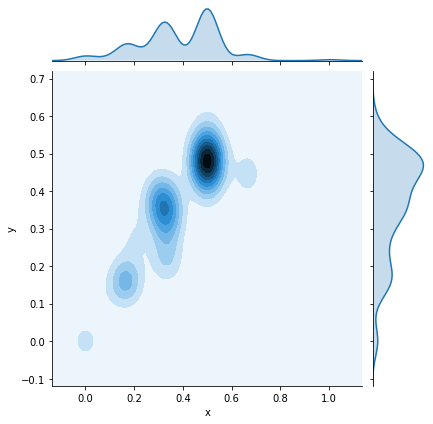

In [60]:
N   = sizes[0]
rho = densities[0]


G = G_dict[('WS', N, rho, 0)]

data = pd.DataFrame(graco.triangle_signature(G), index=('x','y')).T
g = sns.jointplot(x='x', y='y', data=data, kind='kde');

/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been

/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been

/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been

/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been

/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been

/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been

/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been

/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been

/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been

/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been

/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been

/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been

/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been

/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been

/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been

/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been

/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been

/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been

/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been

/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been

/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been

/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been

/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been

/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been

/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been

/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been

/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been

/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been

/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been

/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been

/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been

/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been

/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been

/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been

/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been

/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))
/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been

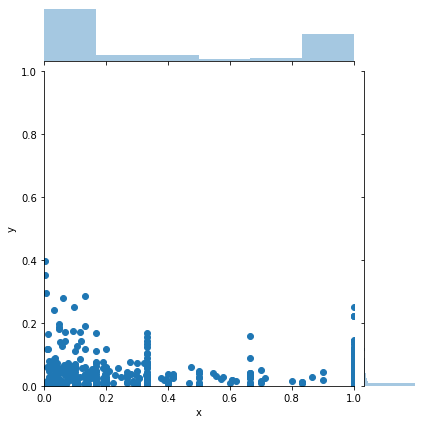

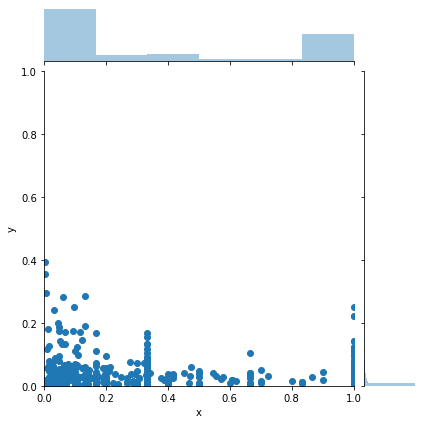

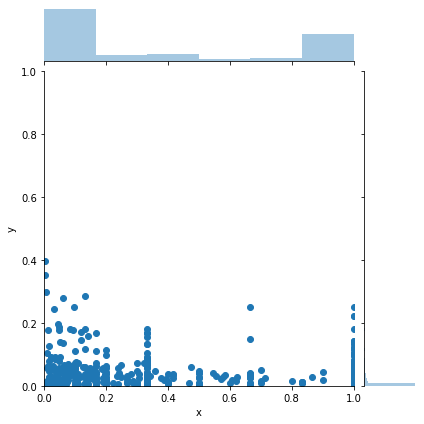

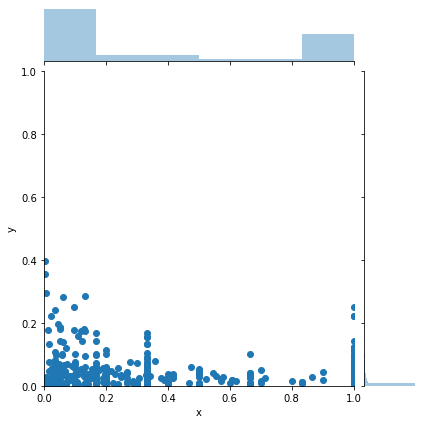

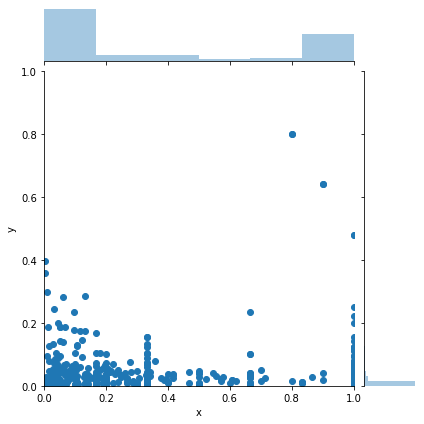

...

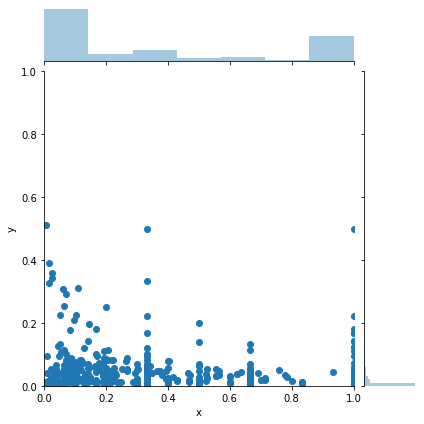

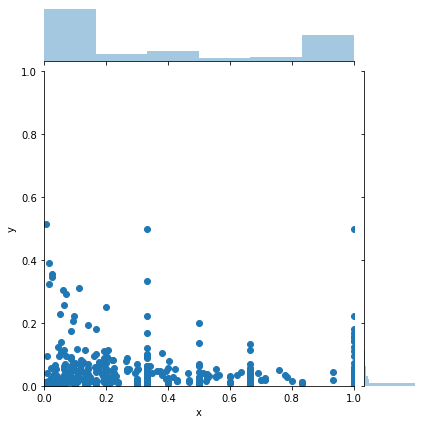

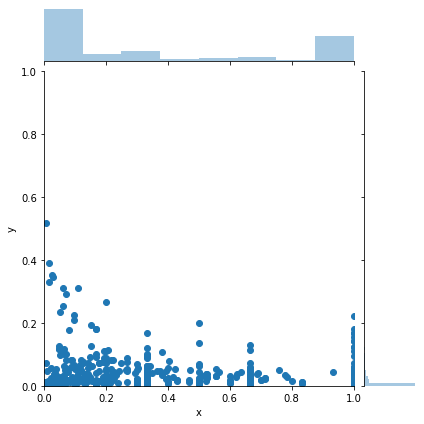

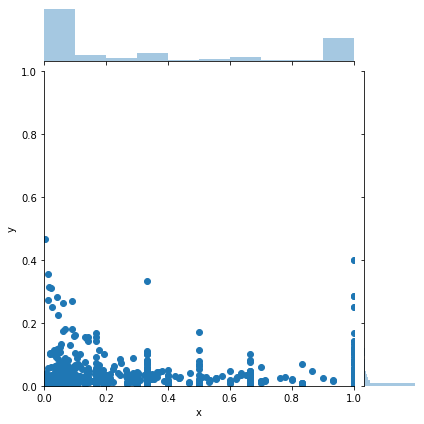

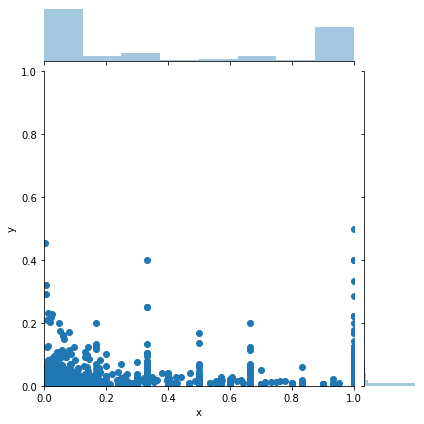

In [36]:
directory = "/Users/markusyoussef/Desktop/git/supplements/data/raw_data/as"

for file in sorted(os.listdir(directory)):
    if not file.endswith('.txt'):
        continue
    else:
        name, _ = file.split('.')
    
    G = nx.read_edgelist(f"{directory}/{name}.txt")

    data = pd.DataFrame(graco.triangle_signature(G), index=('x','y'), dtype=float).T
    g = sns.jointplot(x='x', y='y', data=data, xlim=(0,1), ylim=(0,1), kind='scatter')

    plt.savefig(f"/Users/markusyoussef/Desktop/as_pics/{name}.png")

In [28]:
? sns.jointplot

In [13]:
fig.get_axes()

In [4]:
t = np.array(list(nx.clustering(G).values()))

In [5]:
t

array([0.01210733, 0.11586538, 0.0568306 , ..., 0.        , 0.        ,
       0.        ])

In [6]:
data.x

0       0.012107
1       0.115865
2       0.056831
3       0.003770
4       0.093227
          ...   
3010         NaN
3011         NaN
3012         NaN
3013         NaN
3014         NaN
Name: x, Length: 3015, dtype: float64

In [14]:
A = nx.to_scipy_sparse_matrix(G, format='lil')
A.setdiag(0)
A = scipy.sparse.csc_matrix(A)

/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/scipy/sparse/_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


In [9]:
A2 = A@A

In [10]:
o0 = A.sum(axis=1).A

In [16]:
import scipy

In [18]:
A = scipy.sparse.csc_matrix(A)

In [ ]:
scipy.sparse.eli

In [15]:
A.to_csr()

AttributeError: to_csr not found

In [89]:
len(G[0]), nx.triangles(G, 0)

(192, 222)

In [90]:
2*222/(192*191)

0.012107329842931938

In [91]:
o0[0]

array([192])

In [92]:
graco.orbits(G)

CalledProcessError: Command '['/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/graco/orca/orca', '4', '/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/graco/tmp/33612501.61980669.in', '/Users/markusyoussef/Desktop/git/supplements/venv/graco/lib/python3.7/site-packages/graco/tmp/33612501.61980669.out']' returned non-zero exit status 0.

In [70]:
G['0']

KeyError: '0'

In [76]:
A = nx.to_scipy_sparse_matrix(G)
A2 = A@A
o0 = A.sum(axis=1).A
numer = A.multiply(A2).sum(axis=1).A

D_denom = o0*o0 - o0

In [77]:
numer[0]

array([483])

In [66]:
graco.triangle_signature(G)

(array([0.01317081, 0.11899038, 0.06092896, ...,        nan,        nan,
               nan]),
 array([0.17672887, 0.17362329, 0.13589275, ..., 0.        , 0.        ,
        0.        ]))

In [170]:
G = G_dict[('RGG2', N, rho, 0)]

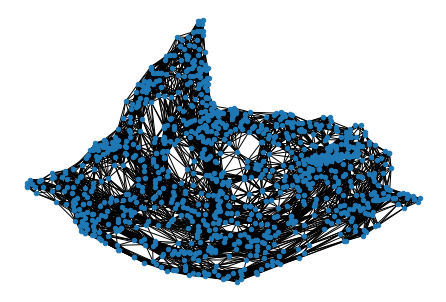

In [171]:
nx.draw(G, node_size=20)

In [191]:
G = G_dict[('WS', N, rho, 0)]
GDV = graco.orbits(G)
GCV = graco.coefficients(G)

In [192]:
GCV.describe().T.nsmallest(15, 'std')

count  mean  std  min  25%  50%  75%  max
Group Equation Orbit                                            
A     0        1      1024.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
               3      1024.0   0.0  0.0  0.0  0.0  0.0  0.0  0.0
      1        10     1024.0   0.0  0.0  0.0  0.0  0.0  0.0  0.0
               13     1024.0   0.0  0.0  0.0  0.0  0.0  0.0  0.0
               4      1024.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
               8      1024.0   0.0  0.0  0.0  0.0  0.0  0.0  0.0
      2        10       24.0   0.0  0.0  0.0  0.0  0.0  0.0  0.0
               13       24.0   0.0  0.0  0.0  0.0  0.0  0.0  0.0
               6        24.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
D     0        2      1016.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
               3      1016.0   0.0  0.0  0.0  0.0  0.0  0.0  0.0
      1        10     1016.0   0.0  0.0  0.0  0.0  0.0  0.0  0.0
               12     1016.0   0.0  0.0  0.0  0.0  0.0  0.0  0.0
               5      1016.0   1.0  0.0  1.0  1.0  1.0  1.0  1.0
               8      1016.0   0.0  0.0  0.0  0.0  0.0  0.0  0.0

In [174]:
GCV['G']

Equation       0-0                 1-1                                \
Orbit            1         3        12         4         8         9   
0         0.392111  0.607889  0.214254  0.469042  0.014031  0.302673   
1         0.441758  0.558242  0.196411  0.445080  0.009860  0.348649   
2         0.500000  0.500000  0.126131  0.530025  0.005484  0.338360   
3         0.338753  0.661247  0.257360  0.475783  0.010446  0.256410   
4         0.525535  0.474465  0.213610  0.424536  0.017276  0.344578   
...            ...       ...       ...       ...       ...       ...   
1019      0.327249  0.672751  0.309297  0.406858  0.010604  0.273241   
1020      0.355049  0.644951  0.269022  0.369812  0.008893  0.352273   
1021      0.464748  0.535252  0.203838  0.410952  0.007489  0.377721   
1022      0.303992  0.696008  0.309475  0.434561  0.014067  0.241898   
1023      0.274933  0.725067  0.266557  0.493951  0.004921  0.234570   

Equation       1-2                                     2-1            \
Orbit           10        12         6         9        11        13   
0         0.353672  0.217401  0.121808  0.307119  0.361984  0.205549   
1         0.275885  0.224679  0.100609  0.398827  0.359641  0.167297   
2         0.269710  0.159059  0.144537  0.426694  0.286360  0.155991   
3         0.372664  0.251120  0.126023  0.250193  0.340026  0.268381   
4         0.242447  0.224761  0.170228  0.362564  0.294694  0.155594   
...            ...       ...       ...       ...       ...       ...   
1019      0.370873  0.269978  0.120642  0.238507  0.400365  0.242777   
1020      0.372198  0.214117  0.133307  0.280378  0.286750  0.288199   
1021      0.315202  0.188753  0.146278  0.349767  0.220809  0.243931   
1022      0.388142  0.287361  0.099885  0.224613  0.437508  0.232297   
1023      0.447758  0.250144  0.081970  0.220127  0.323598  0.339366   

Equation                           3-3                                
Orbit            5         8        10        12        13        14  
0         0.422421  0.010046  0.229203  0.140890  0.188781  0.441125  
1         0.461248  0.011815  0.241270  0.196488  0.139673  0.422569  
2         0.550113  0.007536  0.297030  0.175171  0.157654  0.370145  
3         0.382060  0.009533  0.192809  0.129924  0.148462  0.528805  
4         0.526684  0.023028  0.272426  0.252553  0.138007  0.337014  
...            ...       ...       ...       ...       ...       ...  
1019      0.350006  0.006852  0.185351  0.134927  0.163917  0.515806  
1020      0.416355  0.008697  0.212267  0.122113  0.133774  0.531846  
1021      0.522929  0.012331  0.279094  0.167130  0.121462  0.432313  
1022      0.323617  0.006578  0.168305  0.124604  0.200011  0.507080  
1023      0.332736  0.004300  0.167230  0.093424  0.136112  0.603234  

[1024 rows x 18 columns]